In [51]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [52]:
from __future__ import print_function
import numpy as np
from tqdm import tqdm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
from matplotlib import cm
plt.rcParams.update({'font.size': 14, 'lines.markersize' : 4})

from scipy.optimize import curve_fit
import sys, os
import time, datetime
from datetime import timedelta
import pandas as pd
sys.path.append('/reg/d/psdm/tmo/tmox51020/results/paris/recon')
from recon_funcs import *
import h5py

In [53]:
from matplotlib import cm
from matplotlib.colors import ListedColormap
my_cmap = cm.get_cmap('jet')
xr = np.linspace(0, 1, 2000)
my_cmap = my_cmap(xr)
my_cmap[0][-1] = 0
my_cmap = ListedColormap(my_cmap)

In [54]:
def make_MM(x0):
    xshift, yshift =  x0[8], x0[9] 

    # Coordinates that you want to Perspective Transform
    pts1 = np.float32([[0,0],\
                       [0,1024],\
                       [1024,0],\
                       [1024, 1024]])


    # Size of the Transformed Image
    pts2 = np.float32([[0+xshift-x0[0],0 + yshift-x0[1]],\
                       [0+xshift-x0[2],1024 + yshift-x0[3]],\
                       [1024+xshift-x0[4],0 + yshift-x0[5]],\
                       [1024+xshift-x0[6],1024 + yshift-x0[7]]])

    MM = cv2.getPerspectiveTransform(pts1,pts2)
    return MM

X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskhm=np.zeros((1024,1024))
maskhm[(rs>120) & (rs<420)]=1
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskhmb=np.zeros((1024,1024))
maskhmb[(rs>120) & (rs<450)]=1
nmask = np.reshape(rebin(rebin(maskhm,4),4),[64**2,])


x,y, = 530,512
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-x)**2+(Y-y)**2)
mask=np.zeros((1024,1024))
mask[rs>1*48]=1
x,y, = 530,512

nmask = np.reshape(rebin(rebin(maskhm,4),4),[64**2,]) #rebin later
nnmask = (rebin(np.reshape(nmask, [64,64]))).flatten()
nnmask = rebin(rebin(maskhm,4),4)
#nnmask = (rebin(np.reshape(nmask, [64,64])*(inbg))).flatten()
nnmask[nnmask<0.5] = 0
nnmask[nnmask>=0.5] = 1

maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale [(rs>120) & (rs<270)]=1

In [55]:
def make_quads(x0):
    quads=np.ones((1024,1024))
    quads[:512,:512]= x0[0]
    quads[:512,512:]= x0[1]
    quads[512:,:512]= x0[2]
    quads[512:,512:]= x0[3]
    return quads


In [56]:
PR = PolarRebin('/reg/d/psdm/tmo/tmox51020/results/paris/recon/PR_c32_r32_th32.h5') 

In [57]:
runnum = 127
thresh = 32
MM = make_MM([-17.998,-2.74, 17.9, -17.39, 17.86, 8.52, -3.85, 17.9, 11.47, 47.86])

mfn = 25 
gfn = 15 

# tt = np.array([4410497621974937433, 4410497621983194972, 4410497629973082452,
#        4410497629998117213, 4410497651448051804, 4410497651481475176,
#        4410497651998161186, 4410497652173142369, 4410497660604873720,
#        4410497660613131259, 4410497694490265229, 4410497694998562628,
#        4410497712045526196, 4410497712053914807, 4410497712137145557,
#        4410497712237153529, 4410497712403877173, 4410497715882265975,
#        4410497716132220369, 4410497716165512669, 4410497720519069530,
#        4410497729084232225, 4410497729092620836, 4410497729576014546,
#        4410497737457767587, 4410497737474413737, 4410497737482802348,
#        4410497738016265580, 4410497742069667453, 4410497742469699341,
#        4410497746764798069, 4410497746773186680, 4410497754463312388,
#        4410497754521639449, 4410497758850161549, 4410497759058566104,
#        4410497759283616809, 4410497759292005420, 4410497763812154853,
#        4410497767515594360, 4410497768307400597, 4410497780459610821,
#        4410497780642980615, 4410497793386981132, 4410497793687005048,
#        4410497797940553937, 4410497797957200087, 4410497801760647566,
#        4410497801777424788, 4410497806181051171, 4410497806197697321,
#        4410497806556179370, 4410497806831299597, 4410497806847945747,
#        4410497806864591897, 4410497810309557327, 4410497827798889054,
#        4410497836372440360, 4410497836947584503, 4410497840600954488,
#        4410497841325913981, 4410497849082755361, 4410497853336042106,
#        4410497853944478549, 4410497854069521282, 4410497858481274132,
#        4410497861892816190, 4410497862042893684, 4410497862351175139,
#        4410497862626295366, 4410497866279534279,4410497866429611773, 4410497866462904073, 4410497866671308628,
#        4410497888563218162, 4410497891899918081, 4410497905726704780,
#        4410497905734962319,4410497914291736403, 4410497917844967344, 4410497917878390716,
#        4410497918261645382, 4410497918278422604, 4410497922656752082], dtype =np.uint64)

tt = np.array([4410497651998161186, 4410497690670171600, 4410497694456841857,
       4410497694490265229, 4410497694990305089, 4410497695090313061,
       4410497712020491435, 4410497712137145557, 4410497712245542140,
       4410497712253930751, 4410497716107185608, 4410497716132220369,
       4410497716165512669, 4410497729509298874, 4410497729517687485,
       4410497729576014546, 4410497729601049307, 4410497732995945215,
       4410497737457767587, 4410497737474413737, 4410497737482802348,
       4410497738016265580, 4410497742069667453, 4410497742319752919,
       4410497742469699341, 4410497746323085270, 4410497754463312388,
       4410497755121818353, 4410497763920551436, 4410497767515594360,
       4410497767523982971, 4410497780609688315, 4410497793353688832,
       4410497793378592521, 4410497793678747509, 4410497793687005048,
       4410497806831299597, 4410497806864591897, 4410497828232344314,
       4410497832394142770, 4410497854069521282, 4410497914283347792,
       4410497914291736403, 4410497917844967344, 4410497917878390716,
       4410497918261645382, 4410497918286680143, 4410497922656752082,
       4410497926301864528, 4410497926560207533, 4410497926568465072,
       4410497926593499833, 4410497926660215505, 4410497926893523749,
       4410497930921890861, 4410497939712235333, 4410497943665629234,
       4410497948669172377, 4410497995441170790, 4410497999686331068,
       4410498004223388795, 4410498068303053109, 4410498128671937849,
       4410498133309134620, 4410498162843590708, 4410498167005520236,
       4410498172026233817, 4410498189040953661, 4410498197289839506,
       4410498218549719628, 4410498218583011928, 4410498244621646632,
       4410498270485038009, 4410498274513536193, 4410498282820749099,
       4410498282829137710, 4410498295665281876, 4410498299960773820,
       4410498300360936780, 4410498325842384211, 4410498325859030361,
       4410498338812352937, 4410498343241276225, 4410498343816551440,
       4410498377312921112, 4410498377629722250, 4410498407905652909,
       4410498429424138180, 4410498433085896776, 4410498437973179013,
       4410498446630485357, 4410498446863924673, 4410498450400640536,
       4410498451167543084, 4410498510668337656, 4410498515138810783,
       4410498519184086189, 4410498523871090338, 4410498524096272115,
       4410498528224778271, 4410498562279252720, 4410498584081771117,
       4410498584106805878, 4410498587676945113, 4410498587843668757,
       4410498601455235154, 4410498605408760127, 4410498613982835721,
       4410498648137580286, 4410498652591407263, 4410498656678363580,
       4410498656795148774, 4410498656811794924, 4410498656911933968,
       4410498704187249041, 4410498721010865840, 4410498738659843320,
       4410498746817371948, 4410498755658572374, 4410498755683607135,
       4410498764107867379, 4410498764533065100, 4410498777110866261,
       4410498789897203049, 4410498789922237810, 4410498790097350065,
       4410498794209341143, 4410498794242764515, 4410498794384453398,
       4410498794392710937, 4410498807004066542, 4410498807112594197,
       4410498807371068274, 4410498820032362329, 4410498820199085973,
       4410498824252749990, 4410498858491380665, 4410498858666361848,
       4410498859141629091, 4410498862686733565, 4410498872044620001,
       4410498872052877540, 4410498875481327892, 4410498875606370625,
       4410498875631405386, 4410498879743265392, 4410498879768300153,
       4410498880051808991, 4410498880076843752, 4410498880543722384,
       4410498888942685723, 4410498889192771189, 4410498889201028728,
       4410498892671159991, 4410498892821237485, 4410498893187977073,
       4410498897616769289, 4410498901653656084, 4410498901711983145], dtype =np.uint64)


print(len(tt))
print(len(np.unique(tt)))

159
159


In [73]:
bgdat = np.load('/cds/home/p/paris/cVMI/bgdat_run_127_Jul31.npy')
#bgdat = np.load('/cds/home/p/paris/cVMI/bgdat_run_127_Aug11.npy')
bgdat = np.load('/cds/home/p/paris/cVMI/bgdat_run_127_Aug14.npy')
bins = bgdat['bins_maxim']    
#binvar = maxim #detsum
bg_im = bgdat['bg_im_maxim'] #bgdat['bg_im']

In [74]:
unstreaked = np.load('unstreaked_127.npy')

In [109]:
tt = np.array([4410497652173142369, 4410497712245542140, 4410497720519069530,
       4410497729576014546, 4410497737457767587, 4410497751068285408,
       4410497806356032354, 4410497861892816190, 4410497888563218162,
       4410497917844967344, 4410497917870002105, 4410497926660215505,
       4410497952164207329, 4410498162843590708, 4410498429399103419,
       4410498437422938559, 4410498446638873968, 4410498446730493329,
       4410498450392251925, 4410498587843668757, 4410498652608053413,
       4410498656670106041, 4410498721010865840, 4410498807112594197,
       4410498875589724475, 4410498889167736428], dtype=np.uint64)

In [81]:
#unstreaked
tt = np.array([4410497621958291283,
 4410497660596485109,
 4410497660829793353,
 4410497686491726994,
 4410497690895222305,
 4410497712037137585,
 4410497712387231023,
 4410497715857231214,
 4410497729067586075,
 4410497729184240197,
 4410497729592660696,
 4410497733004333826,
 4410497737466156198,
 4410497746564782125], dtype = np.uint64)

In [61]:
bgdat['quads']

array([[0.92      , 0.94795643, 0.94637416, 0.96728118],
       [0.92000048, 0.94993806, 0.95353105, 0.97151549],
       [0.92      , 0.95501119, 0.95739655, 0.97957406],
       [0.92      , 0.95952566, 0.96501459, 0.98417388],
       [0.92      , 0.96523756, 0.97172142, 0.99641775],
       [0.92      , 0.96704935, 0.98291011, 1.        ],
       [0.92      , 0.96465476, 0.96851334, 1.        ],
       [0.92      , 0.97181689, 0.97664017, 1.        ],
       [0.92      , 0.96888634, 0.97876377, 1.        ],
       [0.92      , 0.9781529 , 0.98034515, 1.        ],
       [0.92      , 0.97639469, 0.98618662, 0.99994135],
       [0.92      , 0.97780733, 0.98592984, 1.        ],
       [0.92      , 0.96982708, 0.97683715, 1.        ],
       [0.        , 0.        , 0.        , 0.        ]])

In [132]:
cVMIs = []
detsum = []
cVMIsold = []
specs = []
unproc = []
maxim = []
gds = []
tmstmps = []
str_unstr = []
str_mean = []

ds=ps.DataSource(exp = 'tmox51020', run= runnum, timestamps=tt)
#ds=ps.DataSource(exp = 'tmox51020', run= runnum, filter = lambda evt:evt.timestamp in tt)

run = next(ds.runs())

opal1 = run.Detector('tmo_opal1') # OPAL camera looking at the holey mirror
gmd = run.Detector("gmd") # gas intensity detector 
timing = run.Detector('timing') # this gives access to evr codes
ebeam = run.Detector("ebeam")
opalfzp = run.Detector('tmo_fzpopal') 



if hasattr(run, 'epicsinfo'):
    epics_strs = [item[0] for item in run.epicsinfo.keys()][1:] # first one is weird
    epics_detectors = [run.Detector(item) for item in epics_strs]    

for nevent, event in enumerate(run.events()):

    # fetch the information from the different events
    im_look=np.copy(opal1.raw.raw(event))  #opal1im_i=np.copy(opal1.raw.image(event)) #doesn't work since update
    im1=im_look

    ims = np.rot90(im1*mask)
    
    binvar = np.max(rebin(rebin(ims,4),4))
    idx = np.max((np.argmax(bins-binvar>0)-1, 0))
    #idx = np.arange(idx-1,idx+1)
    #idx = np.arange(1,13)
    idx = np.array([0,1])
    try:
        len(idx)
        resid = np.mean(bg_im[idx],axis = 0)
        qqs = np.mean(bgdat['quads'][idx],axis = 0)
    except: 
        qqs = bgdat['quads'][idx]
        resid = bg_im[idx]
    
    if 0 in [np.sum(qqss) for qqss in bgdat['quads'][idx]]: continue #need to fix this
    
    qqs = [0.91      , 0.94795643, 0.94637416, 0.99]
    quads = make_quads(qqs)
    ims2 = cv2.warpPerspective(ims*quads,MM,(1024,1024))
    strr = np.copy(ims2)
    str_unstr.append(strr/np.sum(strr) - (unstreaked)/np.sum((unstreaked)))
    strr = strr - np.mean(strr)
    strr[strr<0] = 0
    un = unstreaked - np.mean(unstreaked)
    un[un<0] = 0 
    #str_unstr.append(strr/np.sum(strr) - (unstreaked-np.mean(unstreaked))/np.sum((unstreaked-np.mean(unstreaked))))
    #str_unstr.append(strr/np.sum(strr) - (un)/np.sum(un))
    
    str_mean.append(strr)
    #ims2 = ims2-np.mean(ims2)
    ims2[ims2<0] = 0
    #ims2 = mf(ims2, 5)
    ims2 = gf(ims2, gfn+3)
    ims2= rebin(rebin(ims2,4),4)
    ims2 = gf(ims2, 0.75)
    resid = gf(resid, 0.75)
    resid_scale = resid/np.mean(resid*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
    ims2 = ims2 - resid_scale
    ims2 = ims2*rebin(rebin(maskhm,4),4)*250/np.max(ims2)
    ims2[ims2<thresh] = 0
    
    
    cVMIs.append(ims2)
    #cVMIsold.append(ims2old)
    '''
    fig,axs = plt.subplots(nrows = 1, ncols = 2, figsize = (8,4))
    axs[0].pcolormesh(ims2, cmap = my_cmap)
    axs[0].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    axs[1].pcolormesh(testim, cmap = my_cmap)
    axs[1].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.show()
    '''
    
    opalfz= np.copy(opalfzp.raw.image(event)) #np.copy(opal1.raw.image(event)) #np.copy(opal1.raw.raw(event))
    zps_data = opalfz
    zps_pixel = 100+np.argmax(np.sum(zps_data[100:900],axis=1))
    px_2d_width = 25 #spacing to cut the 2d image slice to store. Typically 50 pixel width. 25 on either side
    px_edge_width = 5 #spacing to integrate for the line out. 

    zps_2d = zps_data[zps_pixel-px_2d_width:zps_pixel+px_2d_width][:]
    zps = zps_data[zps_pixel-px_edge_width:zps_pixel+px_edge_width][:].mean(0)#
    zps_bg = zps_data[zps_pixel-px_2d_width:zps_pixel-px_2d_width+px_edge_width][:].mean(0)#
    zps = zps-zps_bg
    spec = np.squeeze(fastsmooth1(zps,10))
    spec = np.array(np.squeeze(spec) - np.mean(np.squeeze(spec)[800:900])) 
    specs.append(spec)
    gd_i=gmd.raw.energy(event)
    gds.append(gd_i)
    tmstmps.append(event.timestamp)
    
    print(event.timestamp) 

    

4410497652173142369
4410497712245542140
4410497720519069530
4410497729576014546
4410497737457767587
4410497751068285408
4410497806356032354
4410497861892816190
4410497888563218162
4410497917844967344
4410497917870002105
4410497926660215505
4410497952164207329
4410498162843590708
4410498429399103419
4410498437422938559
4410498446638873968
4410498446730493329
4410498450392251925
4410498587843668757
4410498652608053413
4410498656670106041
4410498721010865840
4410498807112594197
4410498875589724475
4410498889167736428


can you subtract mean from str - unstr


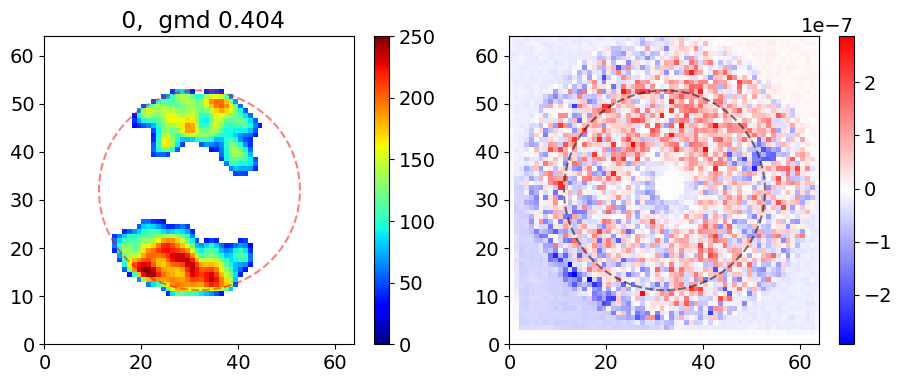

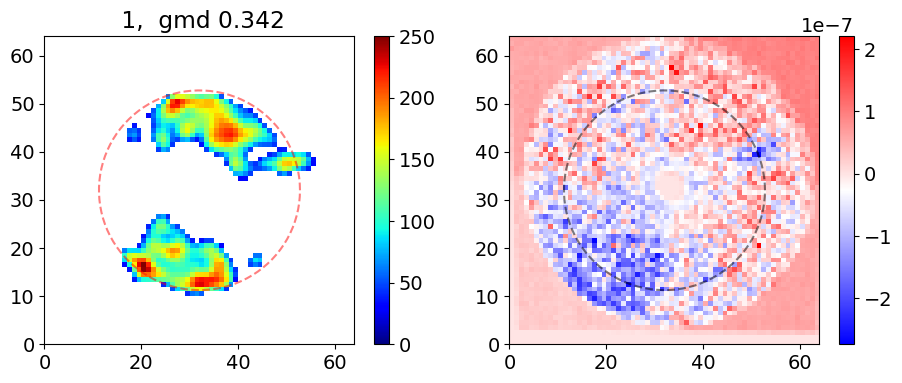

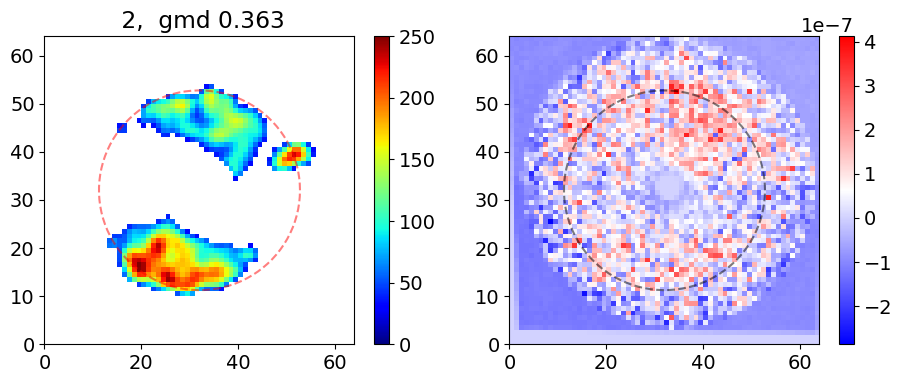

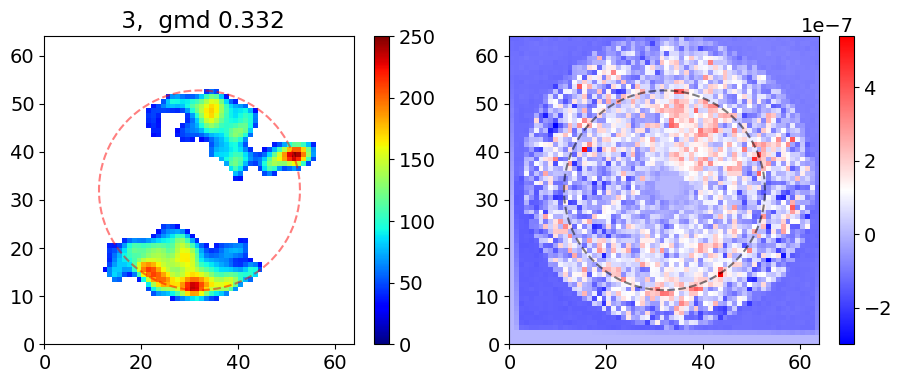

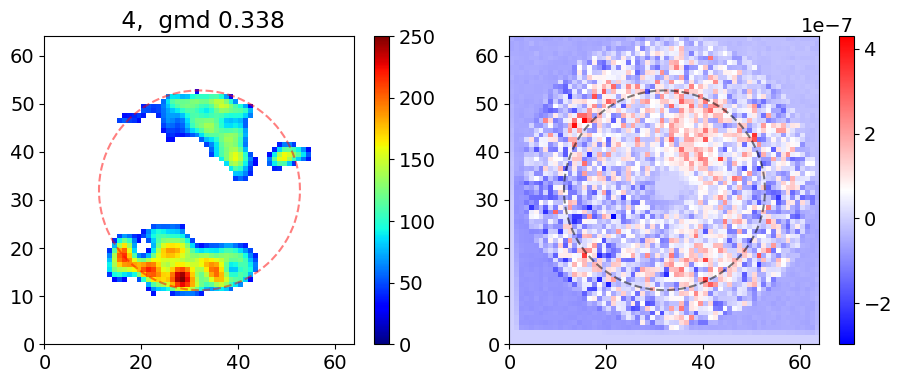

...

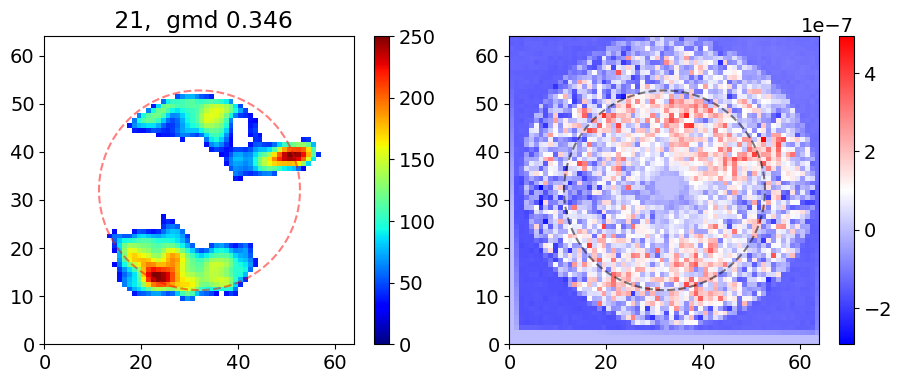

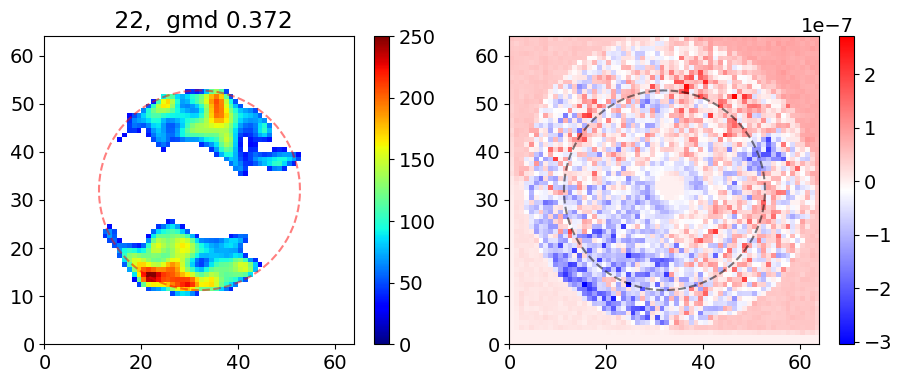

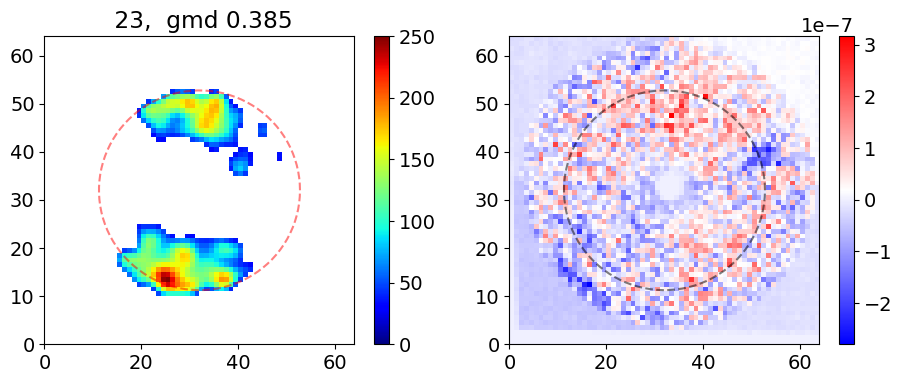

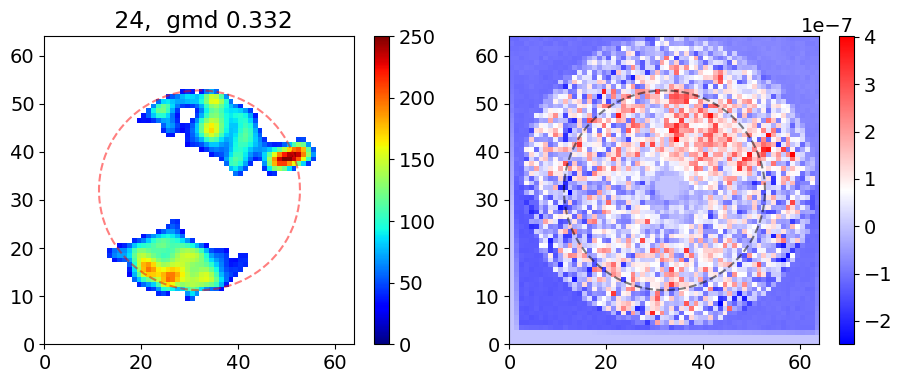

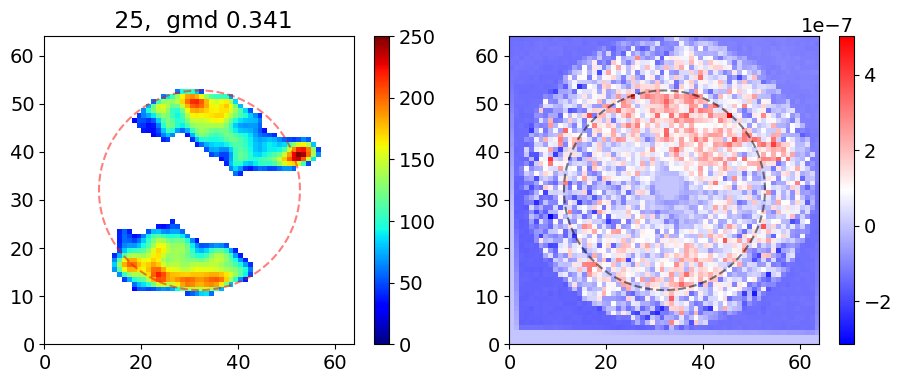

In [133]:
phi_rad = np.linspace(0,360,100)*np.pi/180
print('can you subtract mean from str - unstr')
for i in range(len(specs)):
    c = cVMIs[i]
    c[c<0] = 0
    cVMIs[i] = c
    fig,axs = plt.subplots(nrows = 1, ncols = 2, figsize = (11,4))
    p = axs[0].pcolormesh(c, cmap = my_cmap)
    axs[0].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.colorbar(p, ax = axs[0])
    axs[0].set_title(' %1.0f,  gmd %1.3f' %(i, gds[i]))
    # p = axs[1].pcolormesh(str_unstr[i], cmap = 'bwr')
    # axs[1].plot((512+332*np.cos(phi_rad))/1, (512+332*np.sin(phi_rad))/1, 'k--', alpha = 0.5)
    p = axs[1].pcolormesh(rebin(rebin(str_unstr[i],4),4), cmap = 'bwr')
    axs[1].plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'k--', alpha = 0.5)
    plt.colorbar(p,ax = axs[1])
    plt.show()
    # fig,axs = plt.subplots(nrows = 1, ncols = 3, figsize = (15,4))
    # scc = 1 #np.max(cVMIsa[i]/np.sum(cVMIsa[i]))
    # p = axs[0].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[0])
    # p = axs[1].pcolormesh(cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[1])
    # p = axs[2].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc-cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[2])
    # plt.show()

In [134]:
np.mean(unstreaked)

42.62026090842513

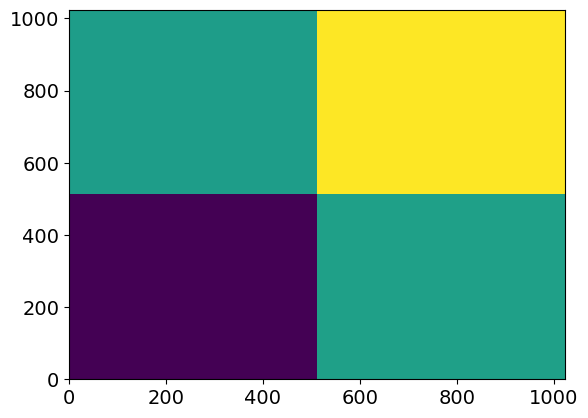

In [93]:
plt.pcolormesh(quads)

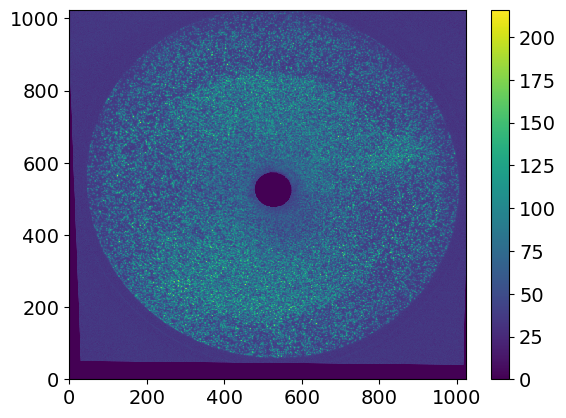

In [64]:
plt.pcolormesh(ims, vmin = 0)
plt.colorbar()

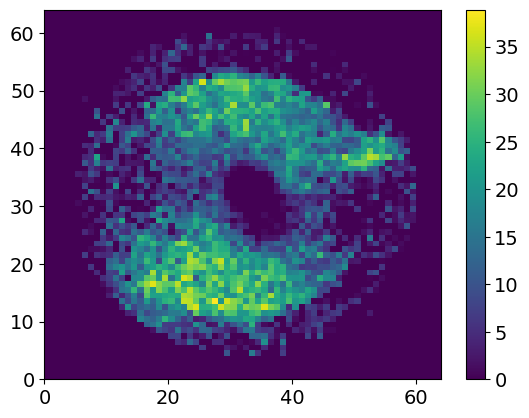

In [49]:
plt.pcolormesh(rebin(rebin(ims,4),4) - 1.1*np.mean(rebin(rebin(ims,4),4)), vmin = 0)
plt.colorbar()

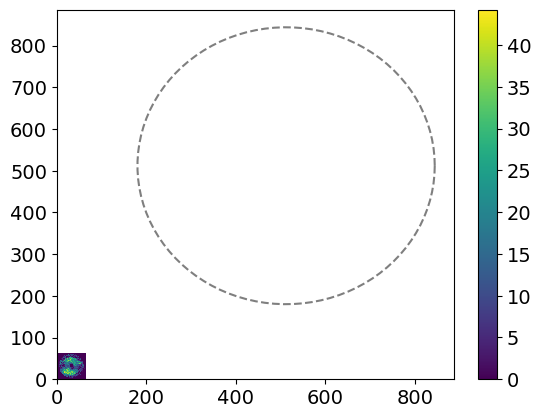

In [41]:
plt.pcolormesh(rebin(rebin(ims-np.mean(ims),4),4), vmin=0)
plt.plot((512+332*np.cos(phi_rad))/1, (512+332*np.sin(phi_rad))/1, 'k--', alpha = 0.5)
plt.colorbar()

In [11]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Aug3_127.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Aug3_127.npy', cVMIs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/GDs_Aug3_127.npy', gds)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/tmpstmps_Aug3_127.npy', tmstmps)


In [18]:
cVMIs = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Aug1_127.npy')

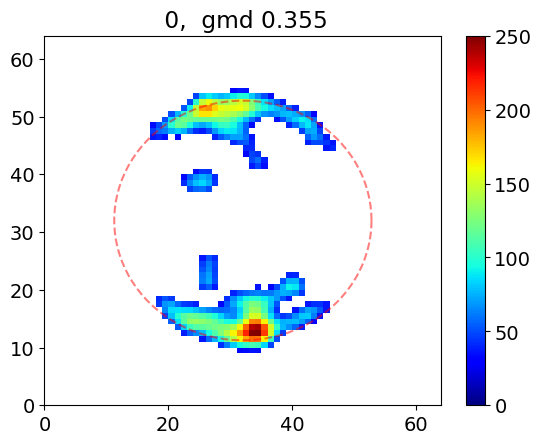

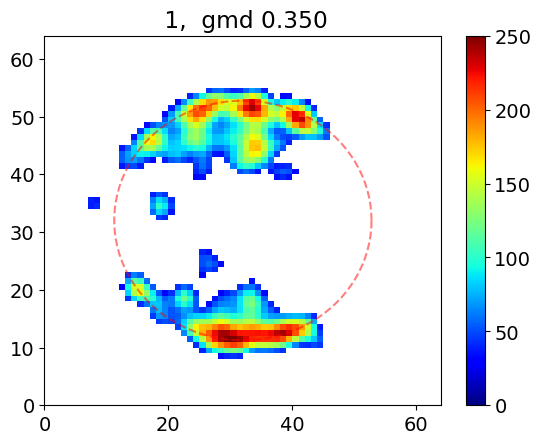

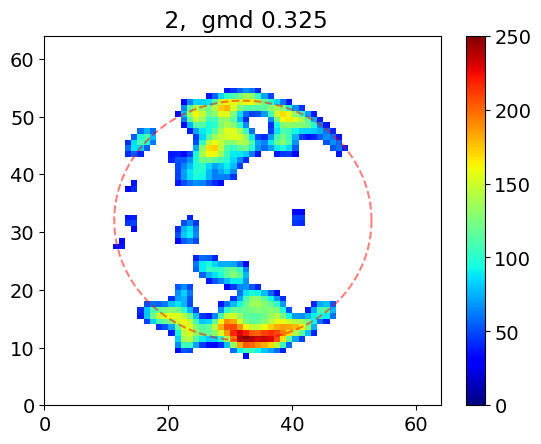

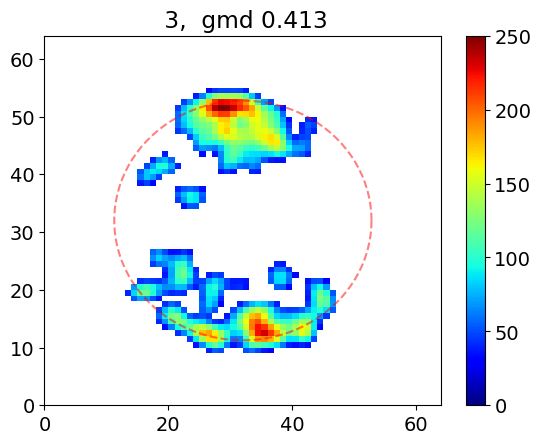

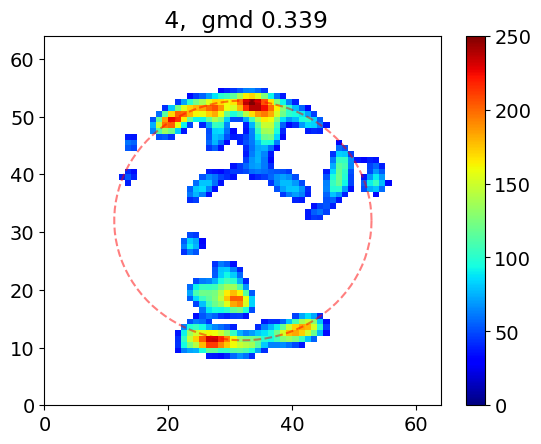

...

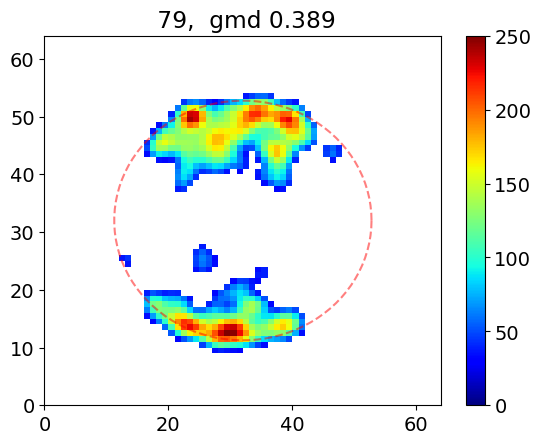

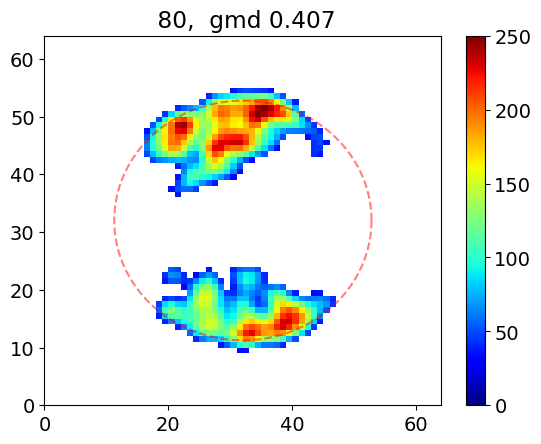

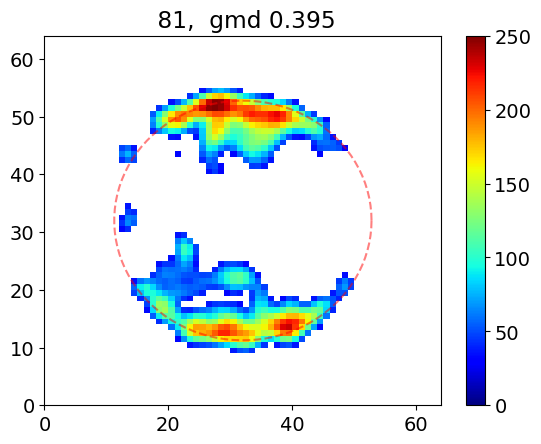

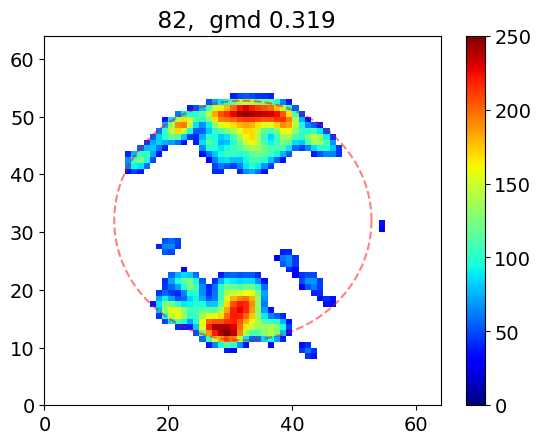

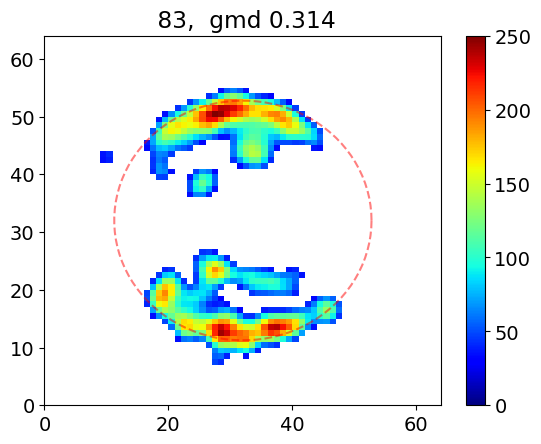

In [19]:
phi_rad = np.linspace(0,360,100)*np.pi/180

for i in range(len(specs)):
    c = cVMIs[i]
    c = gf(c,1)
    c = c*250/np.max(c)
    c[c<32] = 0
    plt.pcolormesh(c, cmap = my_cmap)
    plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.colorbar()
    plt.title(' %1.0f,  gmd %1.3f' %(i, gds[i]))
    plt.show()
    # fig,axs = plt.subplots(nrows = 1, ncols = 3, figsize = (15,4))
    # scc = 1 #np.max(cVMIsa[i]/np.sum(cVMIsa[i]))
    # p = axs[0].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[0])
    # p = axs[1].pcolormesh(cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[1])
    # p = axs[2].pcolormesh(cVMIsa[i]/np.sum(cVMIsa[i])/scc-cVMIsb[i]/np.sum(cVMIsb[i])/scc, cmap = my_cmap)
    # plt.colorbar(p, ax = axs[2])
    # plt.show()

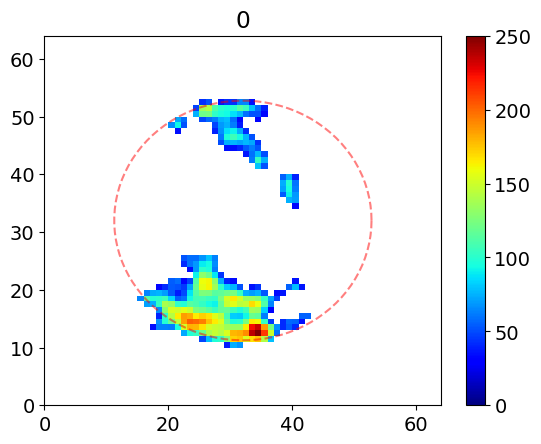

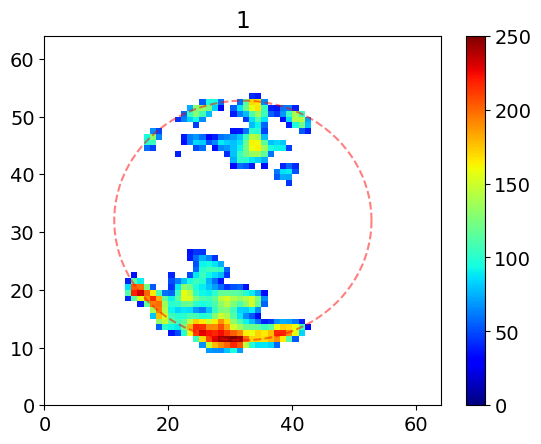

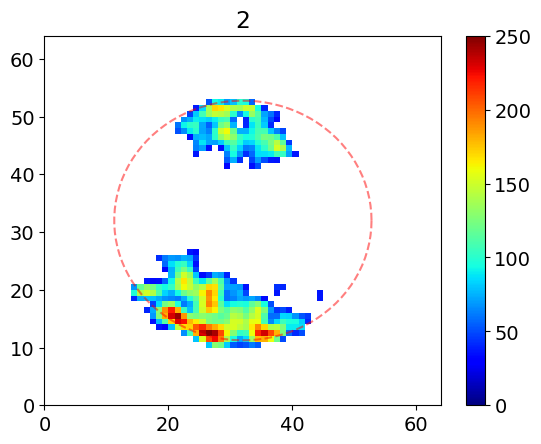

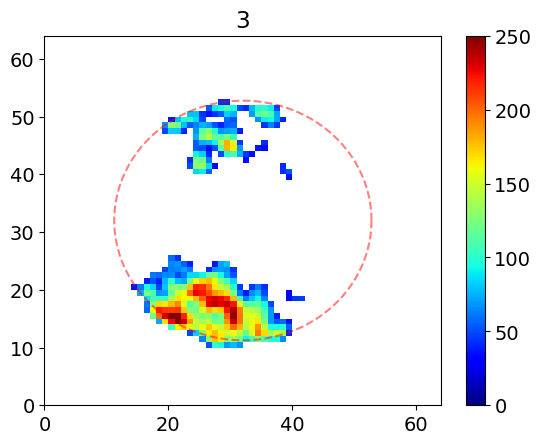

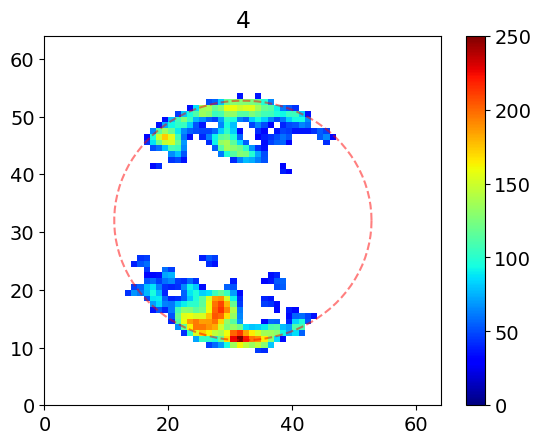

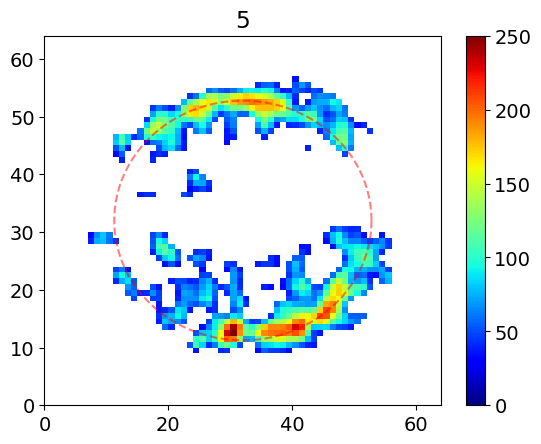

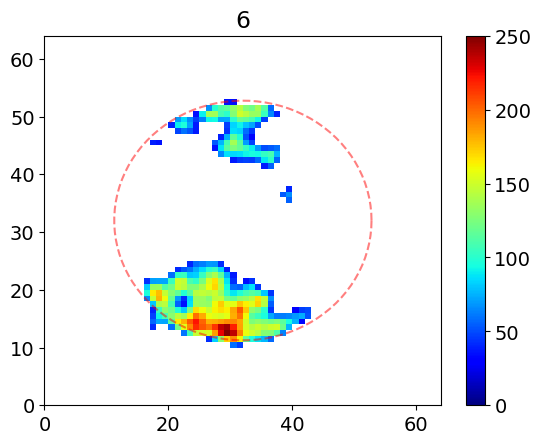

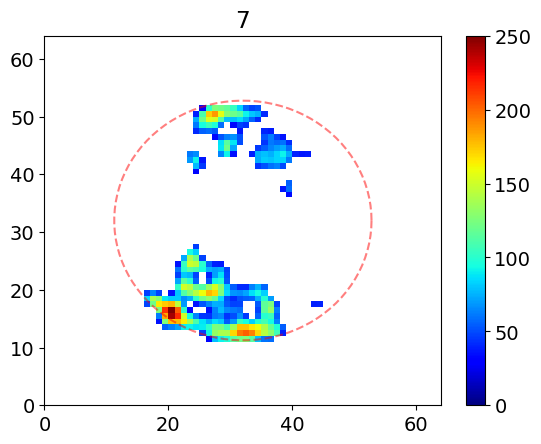

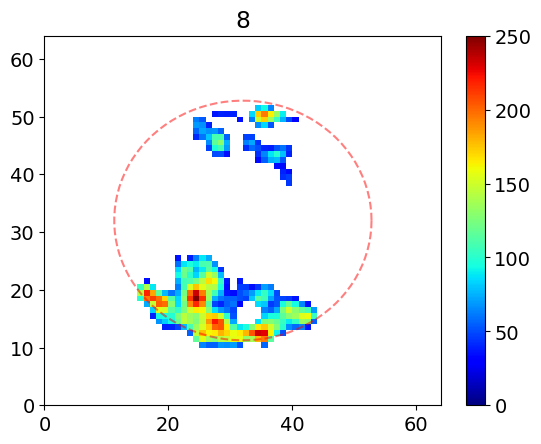

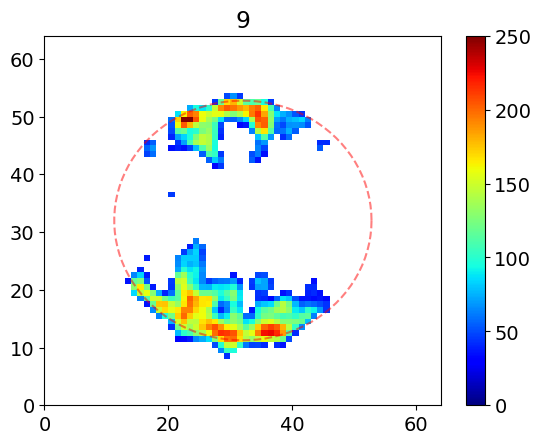

In [11]:
cVMIs2 = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Mar25_127.npy', allow_pickle = True)[()]
phi_rad = np.linspace(0,360,100)*np.pi/180

for i in range(10):
    c = cVMIs2[i]
    c[c<0] = 0
    plt.pcolormesh(c, cmap = my_cmap)
    plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
    plt.colorbar()
    plt.title(i)
    plt.show()

Text(0.5, 1.0, '5')

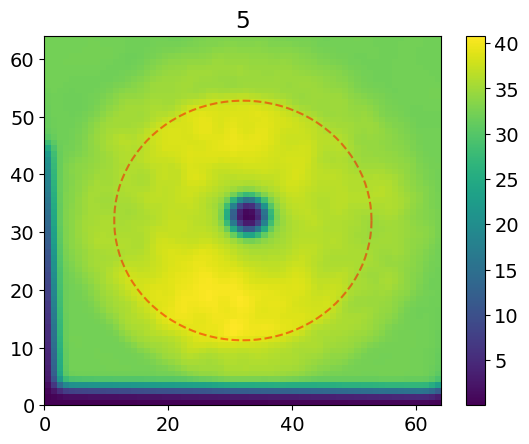

In [34]:
i = 5
plt.pcolormesh(unproc[i])
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.title(i)

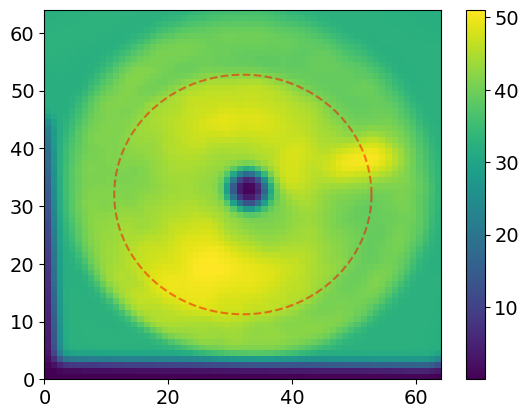

In [28]:
plt.pcolormesh(resid)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)

plt.colorbar()

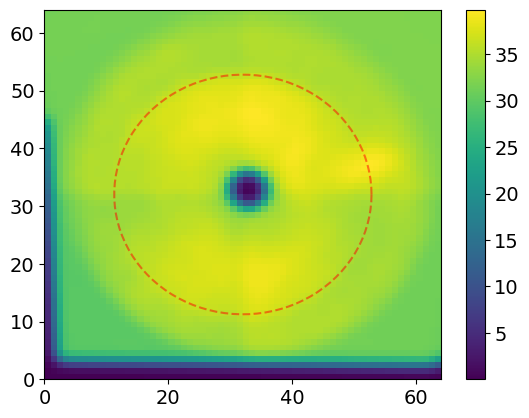

In [29]:
resid2= np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Jan/bg_run_127_Mar.npy')
plt.pcolormesh(resid2)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)

plt.colorbar()

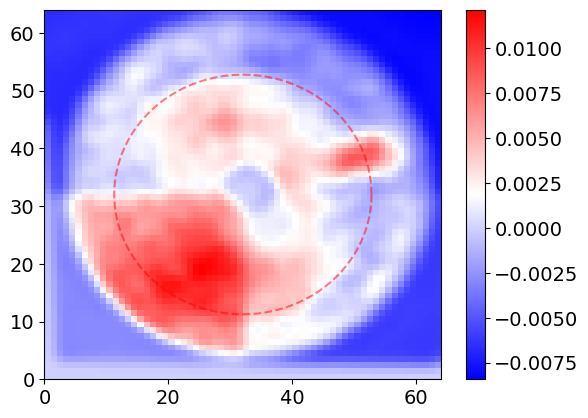

In [33]:
plt.pcolormesh((resid/np.sum(resid)-resid2/np.sum(resid2))*250, cmap = 'bwr')
plt.colorbar()
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)


In [15]:
len(cVMIs2)

115

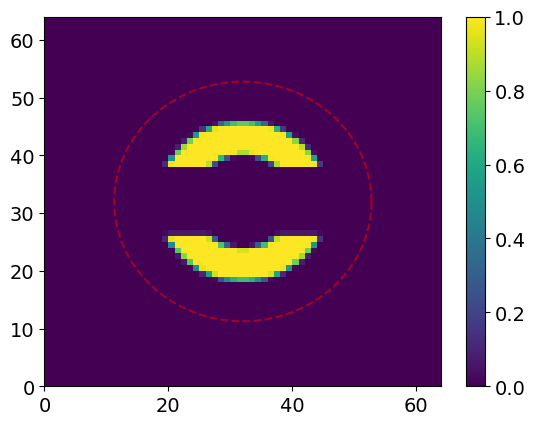

In [42]:
# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# testmask [(rs>100) & (rs<220)] = 1

testmask = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
testmask [(rs>130) & (rs<220)]=1
testmask [(Y>26*16) & (Y<38*16)]=0

# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# testmask [(rs>140) & (rs<220) & (X>28*16) &(X<36*16)]=1

# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# #testmask[(Y>26*16) & (Y<38*16) & (rs>80)]=1
# testmask[(Y>28*16) & (Y<36*16) & (rs>80)]=1
# testmask [(rs>390) & (rs<430)]=1


# testmask = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# testmask [(rs>390) & (rs<430)]=1

plt.pcolormesh(rebin(rebin(testmask,4),4))
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()


In [43]:
ims2 = np.copy(ims)
ims2 = mf(ims2, mfn)
ims2 = gf(ims2, gfn)
ims2= rebin(rebin(ims2,4),4)
unproc = ims2

#resid_scale = resid/np.mean(resid[24:36,22:27])*np.mean(ims2[24:36,22:27])
resid_scale = resid/np.mean(resid*rebin(rebin(testmask,4),4))*np.mean(ims2*rebin(rebin(testmask,4),4))
#residold_scale = residold/np.mean(residold*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
#ims2old = ims2 - residold_scale
ims2 = ims2 - resid_scale
ims2 = gf(ims2,.25)
#ims2old = gf(ims2old,.25)
#ims2 = rebin(ims2) #*inbg
ims2 = ims2*250/np.max(ims2)#*rebin(rebin(maskhm,4),4)



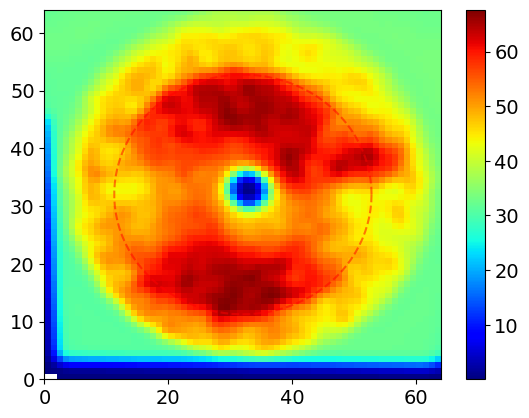

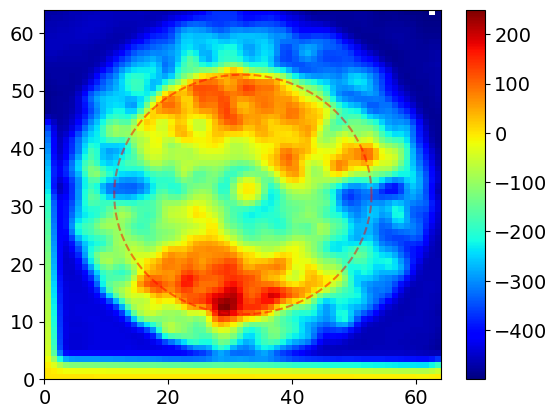

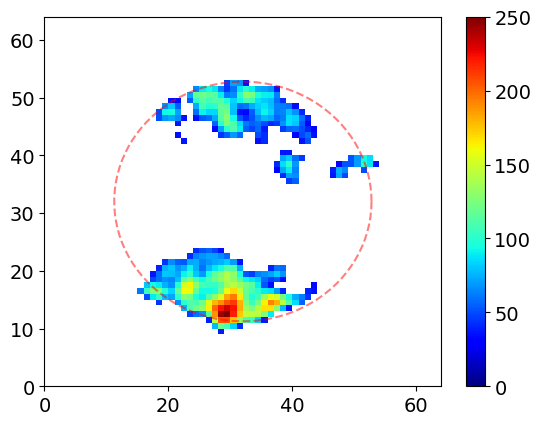

In [44]:
plt.pcolormesh(unproc, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()
plt.pcolormesh(ims2, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()
ims2[ims2<thresh] = 0
plt.pcolormesh(ims2*rebin(rebin(maskhm,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()

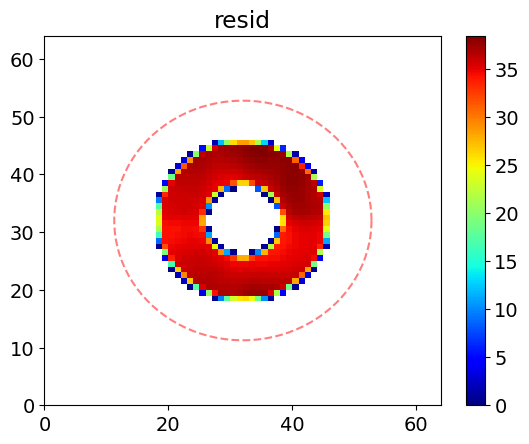

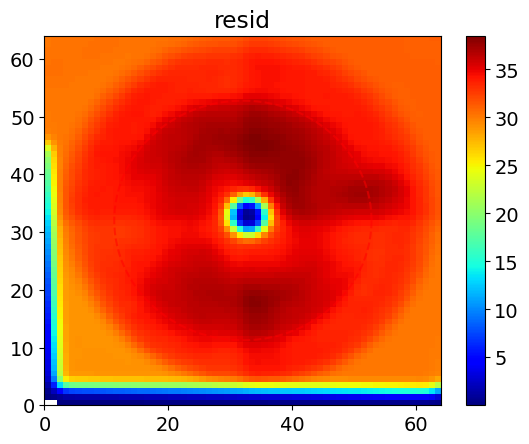

In [57]:
plt.pcolormesh(resid*rebin(rebin(testmask,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.title('resid')
plt.show()


plt.pcolormesh(resid, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.title('resid')
plt.show()

In [250]:
maskscale = np.zeros((1024,1024))
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskscale [(rs>100) & (rs<220)]=1
#maskscale [(rs>120) & (rs<250)]=1



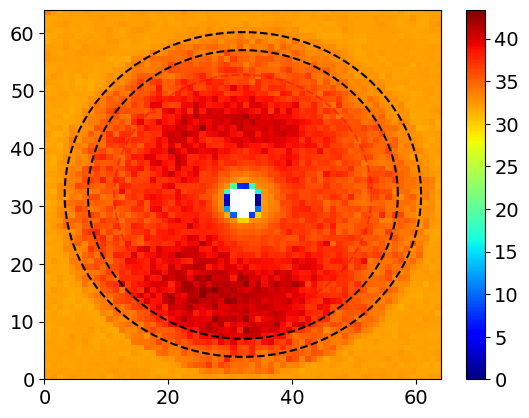

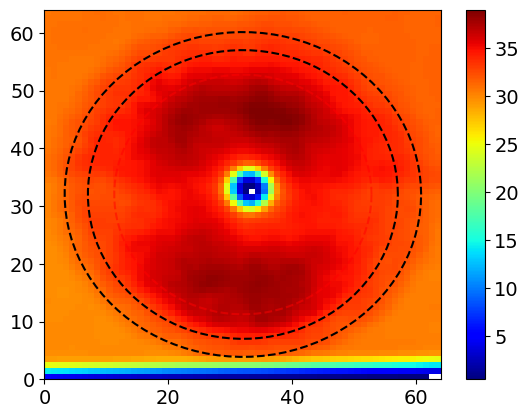

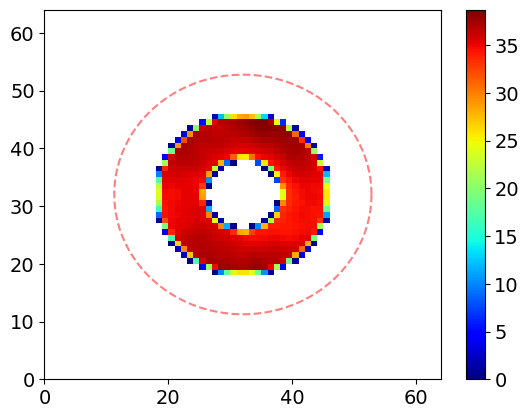

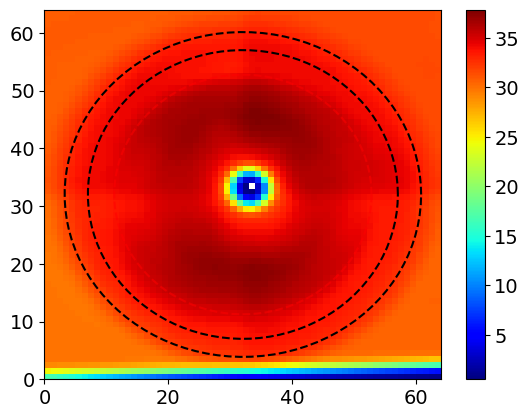

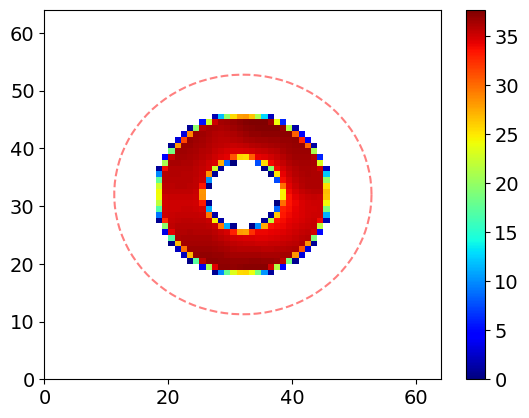

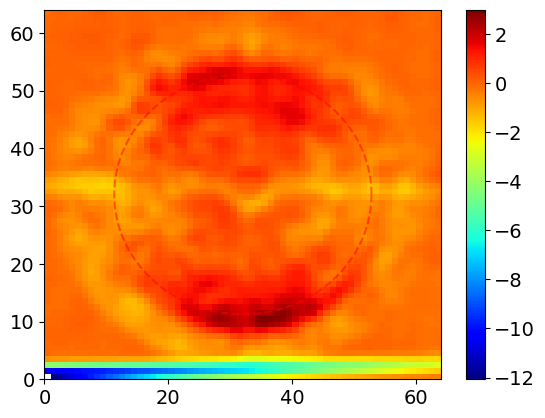

In [251]:
ims = np.rot90(im1*mask)
plt.pcolormesh(rebin(rebin(ims,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.plot((512+400*np.cos(phi_rad))/16, (512+400*np.sin(phi_rad))/16, 'k--')
plt.plot((512+460*np.cos(phi_rad))/16, (512+450*np.sin(phi_rad))/16, 'k--')
plt.colorbar()
plt.show()

gasoff = 0 #gasoff0/np.mean(gasoff0)*np.mean(ims)
ims = cv2.warpPerspective(ims-gasoff,MM,(1024,1024))*quads
ims[ims<0] = 0
ims2 = np.copy(ims)
ims2 = mf(ims2, mfn)
ims2 = gf(ims2, gfn)
ims2= rebin(rebin(ims2,4),4)
plt.pcolormesh(ims2, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.plot((512+400*np.cos(phi_rad))/16, (512+400*np.sin(phi_rad))/16, 'k--')
plt.plot((512+460*np.cos(phi_rad))/16, (512+450*np.sin(phi_rad))/16, 'k--')
plt.colorbar()
plt.show()

plt.pcolormesh(ims2*rebin(rebin(maskscale,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()

plt.pcolormesh(resid, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.plot((512+400*np.cos(phi_rad))/16, (512+400*np.sin(phi_rad))/16, 'k--')
plt.plot((512+460*np.cos(phi_rad))/16, (512+450*np.sin(phi_rad))/16, 'k--')
plt.colorbar()
plt.show()

plt.pcolormesh(resid*rebin(rebin(maskscale,4),4), cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()



plt.pcolormesh(ims2 - resid, cmap = my_cmap)
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.colorbar()
plt.show()


In [248]:
# maskscale3 = np.zeros((1024,1024))
# X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
# rs=np.sqrt((X-512)**2+(Y-512)**2)
# maskscale3[(rs>400) & (rs<450)]=1



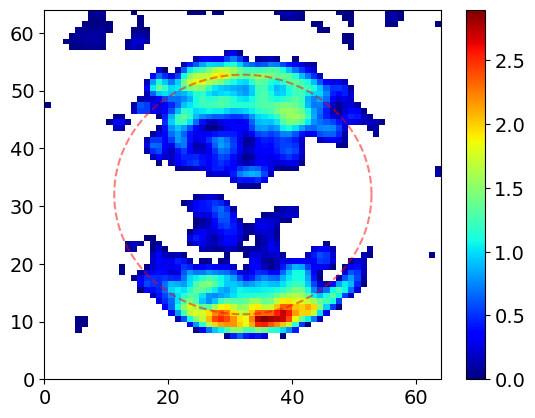

In [252]:
resid_scale = resid/np.mean(resid*rebin(rebin(maskscale,4),4))*np.mean(ims2*rebin(rebin(maskscale,4),4))
ims2 = ims2 - resid_scale
ims2 = gf(ims2,.25)
ims2[ims2<0] = 0
phi_rad = np.linspace(0,360,100)*np.pi/180
plt.plot((512+332*np.cos(phi_rad))/16, (512+332*np.sin(phi_rad))/16, 'r--', alpha = 0.5)
plt.pcolormesh(ims2, cmap = my_cmap)
plt.colorbar()
plt.show()

In [51]:
len(specs)

42

In [52]:
len(cVMIs)

42

In [53]:
len(tt)

42

(array([7., 4., 5., 7., 4., 3., 5., 4., 2., 1.]),
 array([0.15234375, 0.16209717, 0.17185059, 0.181604  , 0.19135742,
        0.20111084, 0.21086426, 0.22061768, 0.23037109, 0.24012451,
        0.24987793]),
 <BarContainer object of 10 artists>)

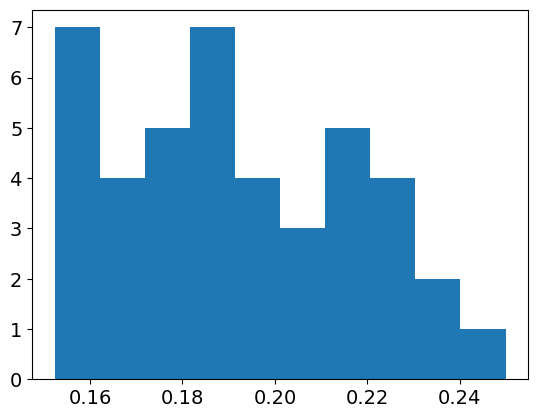

In [15]:
plt.hist(gds)

In [16]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/GDs_Jan19_110_2.npy', gds)

In [60]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jan19_110_2.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jan19_110_2.npy', cVMIs)

In [63]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jan16_110.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jan16_110.npy', cVMIs)

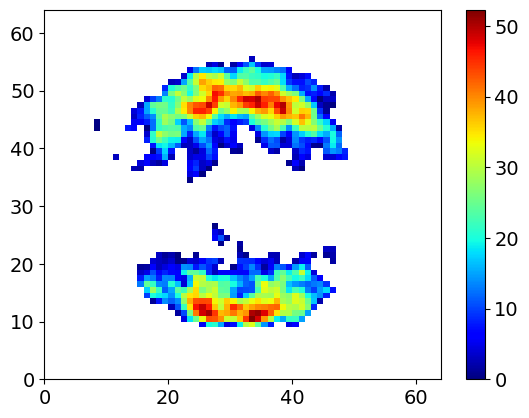

In [69]:
plt.pcolormesh(cVMIs[-10], cmap = my_cmap)
plt.colorbar()

In [9]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Jan11.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Jan11.npy', cVMIs)

In [48]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Dec16.npy', specs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Dec16.npy', cVMIs)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_nobg_Dec16.npy', unproc)
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/ts_Dec16.npy', tt)

In [32]:
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_Nov5.npy', specs)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_Nov5.npy', cVMIs)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_oldresid_Nov5.npy', cVMIsold)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/ts_Nov5.npy', tt)

In [13]:
np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_nobg_Nov5.npy', unproc)

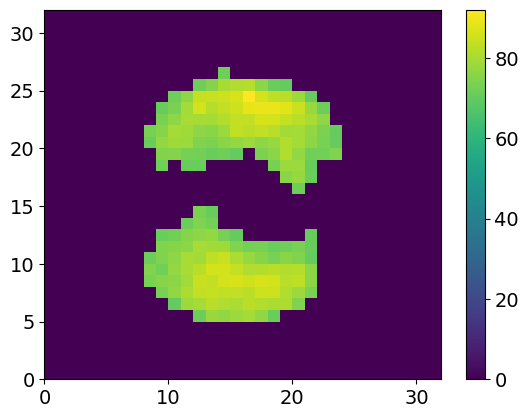

In [30]:
aa = rebin(unproc[0])
aa[ aa<70] = 0
plt.pcolormesh(aa)
plt.colorbar()

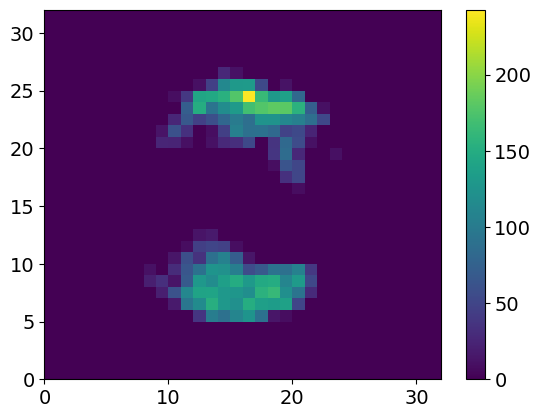

In [28]:
bb = rebin(cVMIs[0])
bb[bb<0] = 0
plt.pcolormesh(bb)
plt.colorbar()

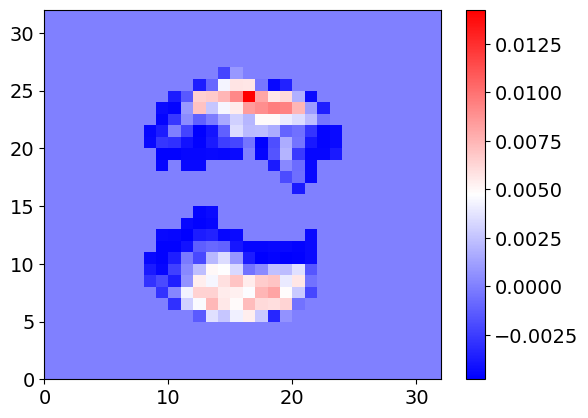

In [33]:
plt.pcolormesh(bb/np.sum(bb) - aa/np.sum(aa), cmap = 'bwr')
plt.colorbar()


/tmp/ipykernel_15835/1804110446.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axs = plt.subplots(nrows = 1, ncols = 5, figsize = (16,3))


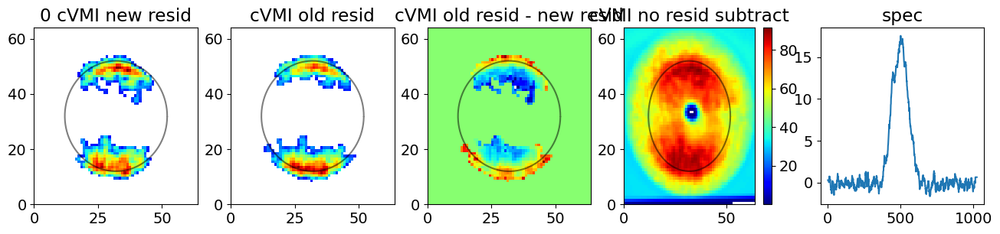

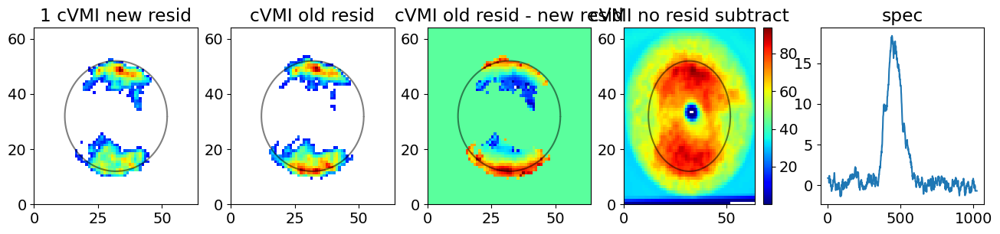

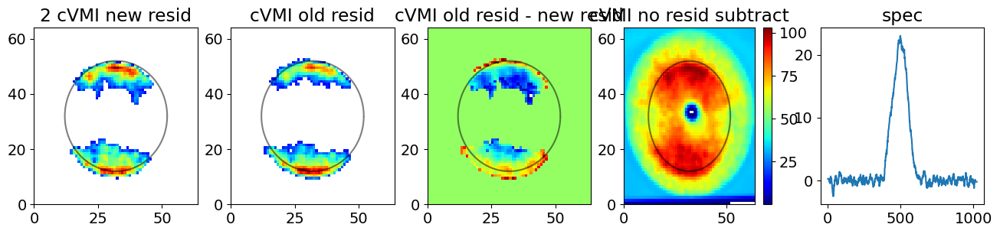

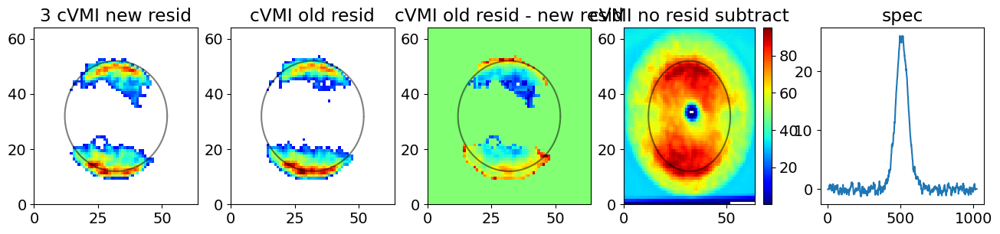

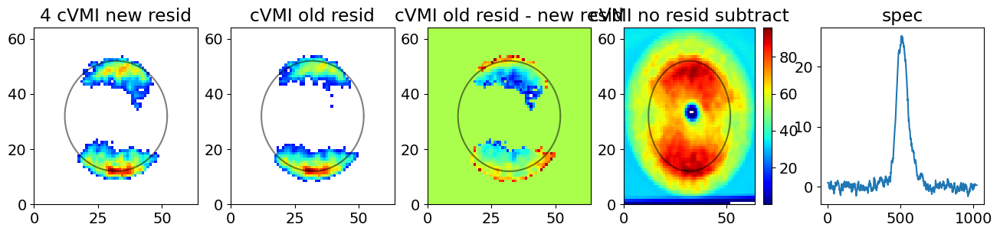

...

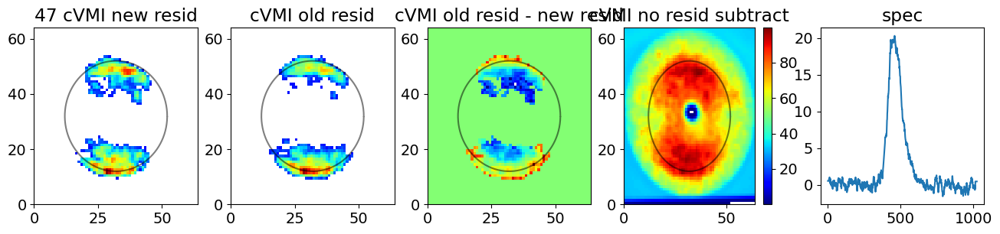

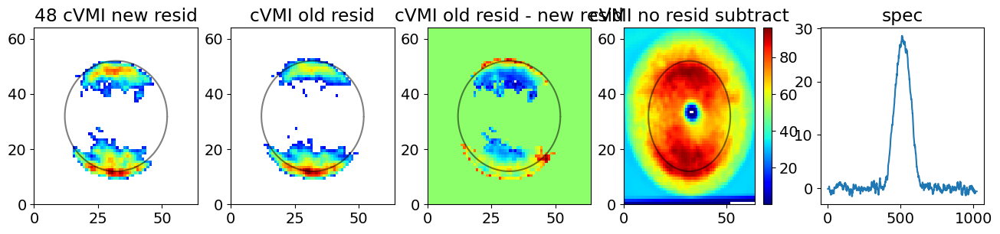

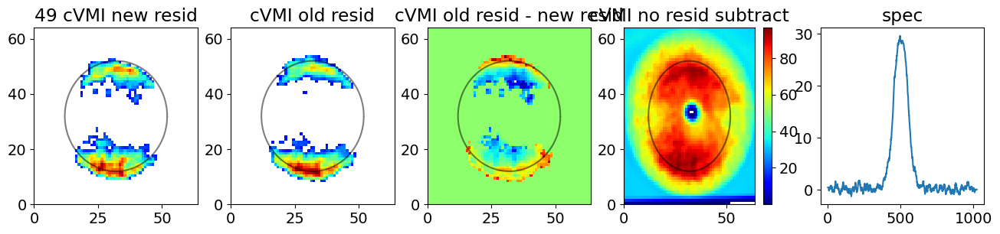

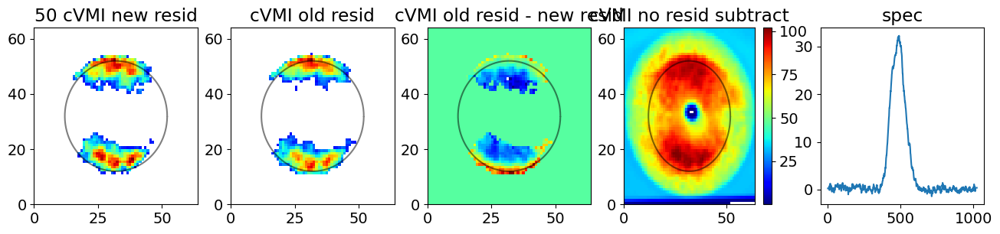

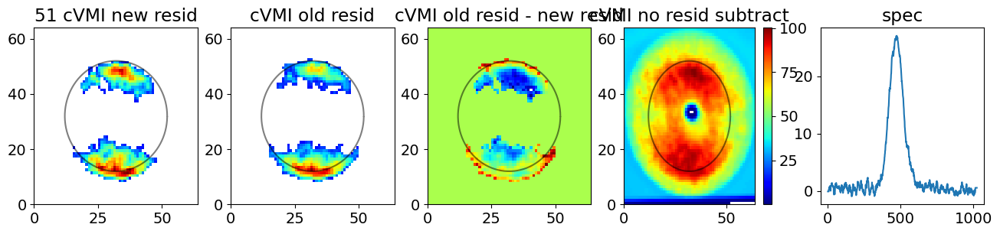

In [49]:
for i in range(len(tt)):
    fig,axs = plt.subplots(nrows = 1, ncols = 5, figsize = (16,3))
    axs[0].pcolormesh(cVMIs[i], cmap = my_cmap)
    axs[1].pcolormesh(cVMIsold[i], cmap = my_cmap)
    axs[2].pcolormesh(cVMIsold[i]-cVMIs[i], cmap = my_cmap)
    p =axs[3].pcolormesh(unproc[i], cmap = my_cmap)
    phis = np.linspace(0,359,100)*np.pi/180
    axs[0].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[1].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[2].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[3].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
    axs[4].plot(specs[i])
    axs[0].set_title('%1.0f cVMI new resid' %i)
    axs[1].set_title('cVMI old resid')
    axs[2].set_title('cVMI old resid - new resid')
    axs[3].set_title('cVMI no resid subtract')
    axs[4].set_title('spec')
    plt.colorbar(p, ax = axs[3])

In [9]:
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', specs)
# np.save('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_testOct28.npy', cVMIs)


In [48]:
b = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', allow_pickle = True)[()]

In [49]:
len(b)

17

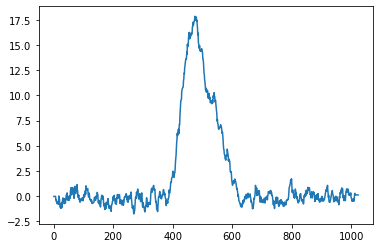

In [52]:
plt.plot(b[12])

In [97]:
tt[10]

4410467694582375735

In [105]:
tt = [4410467754356193385,4410467118580787210,4410467689813058340,4410467428163571153,4410466620736521535,4410467136200535625,4410467724635877132,4410466707012051433,4410467488239378799,
      4410467689813058340, 4410467694582375735,4410466861291017268,4410467028356057715,4410467093272092735,4410467354904540559,4410467518544276382,4410467530828476158, 4410467668872994012] #[4410466500172553581]#[4410466517201035991] #[4410466517376017174] #[4410466521487221820] #[4410466500172553581] #[4410467694582375735] #[4410467436627939444]
tt= np.array(tt)
tt= tt[np.argsort(tt)]
tt[16]

4410467724635877132

In [106]:
ttnew = [4410467754356193385,4410467118580787210,4410467428163571153,4410466620736521535,4410467136200535625,4410467724635877132,4410466707012051433,4410467488239378799,
      4410467689813058340, 4410467694582375735,4410466861291017268,4410467028356057715,4410467093272092735,4410467354904540559,4410467518544276382,4410467530828476158, 4410467668872994012,
      4410466482935666616, 4410466573846689349, 4410466594694478956, 4410466654584819656, 4410466684855376363, 4410466684972030485,4410466732255078812, 4410466753627943040, 4410466771014121067,
      4410466861457740912, 4410466865519007108, 4410466869746996948, 4410466925753018715, 4410466930289290010, 4410466981025037018]

ttnew= np.array(ttnew)
ttnew= ttnew[np.argsort(ttnew)]
np.where(np.array(ttnew) == 4410467724635877132)

(array([30]),)

In [99]:
ttnew[9]

4410467694582375735

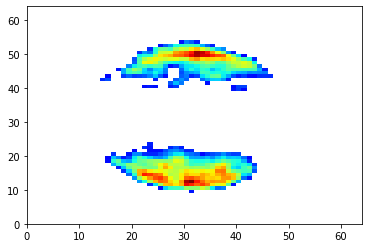

In [42]:
plt.pcolormesh(b, cmap = my_cmap)

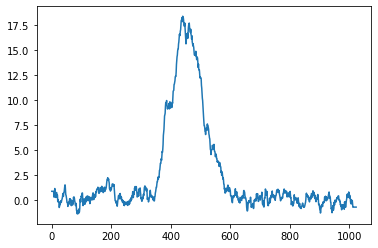

In [62]:
c = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_Oct31.npy', allow_pickle = True)[()][0]
plt.plot(c)

In [24]:
np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_test.npy', allow_pickle = True)[()].shape

(17, 1024)

In [65]:
from scipy.interpolate import interp1d

In [70]:
Bps = []
alphas = []
vNaxiss = []

Np = 128
N_w=6
N_t=6 
energy_x = 54 #eV
hbar=6.6e-16 #eV*s
Nb=N_t*N_w
basesdir = '/reg/d/psdm/tmo/tmox51020/results/paris/circularpol_vNbases_dipole_K5/'

Up = 0.7  
filename = 'Bpbasis_Np' + str(Np) + '_Nw' + str(N_w) +'_Nt' + str(N_t) + '_Up' + str(Up)+'.npy'
br = np.load(basesdir+filename, allow_pickle=True)
Breal = br[()]['Breal']
Bimag = br[()]['Bimag']
breal = br[()]['breal']
bimag = br[()]['bimag']
vNaxis = br[()]['vNaxis']
alpha = br[()]['alpha']
Bp_basis = Breal+1j*Bimag

In [71]:
N = 2801
xf = np.arange(-N/2,N/2,1)/((vNaxis['t_sample'][-1] - vNaxis['t_sample'][0])) #using tsample range
eV = 1239.84*(2*np.pi*xf)/2.9979E8/(2*np.pi)*1e-9 

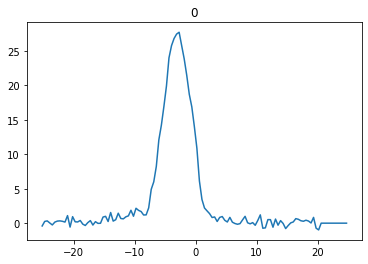

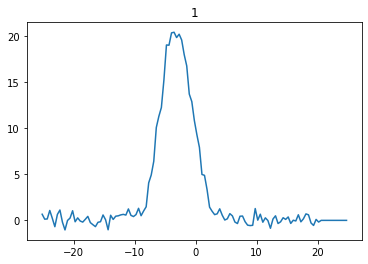

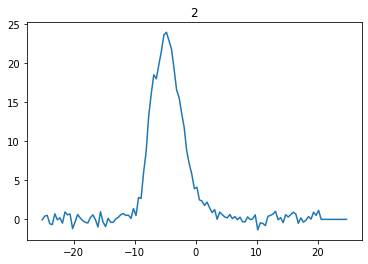

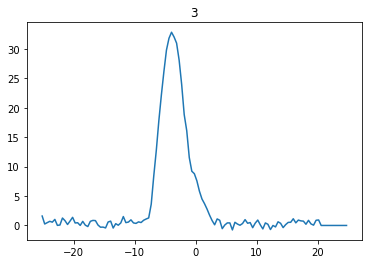

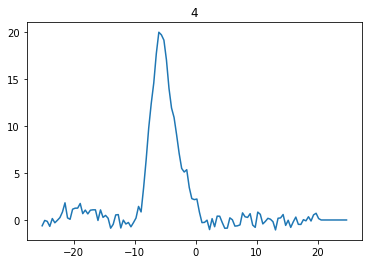

...

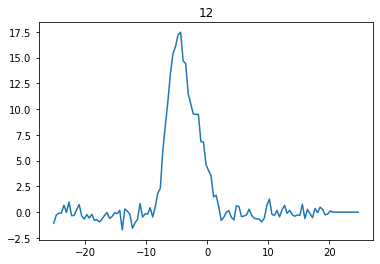

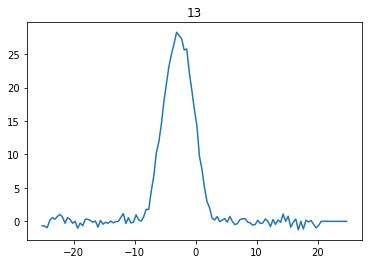

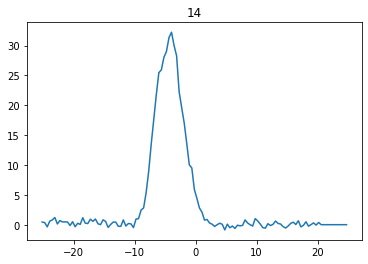

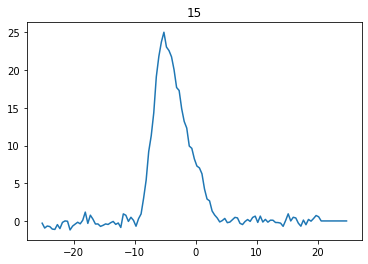

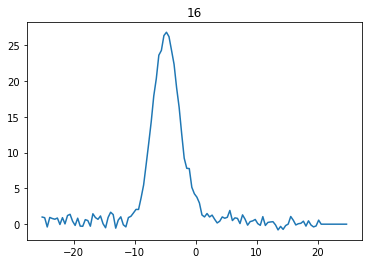

In [93]:
for i in range(17):
    fig,axs = plt.subplots()
    c = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', allow_pickle = True)[()][i]
    eshift = 2.9
    xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
    xeV = xeV - eshift #2.5 #3 #know this from previous calibration
    f = interp1d(xeV,c, bounds_error=False, fill_value = 0)
    spec_in = f(eV[1340:-1340])
    #plt.plot(eV[1340:-1340], spec_in, ':')
    plt.plot(eV[1340:-1340], spec_in)
    plt.title(i)
    

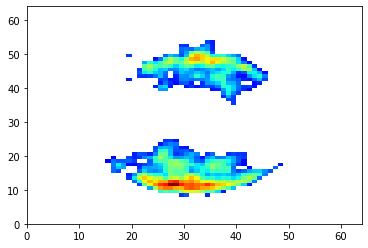

In [94]:
m = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/Ms_testOct28.npy', allow_pickle = True)[()][10]
plt.pcolormesh(m, cmap = my_cmap)
   

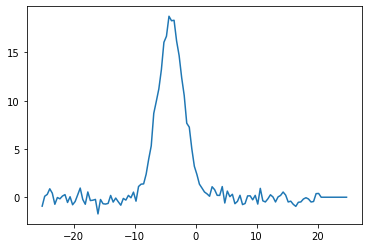

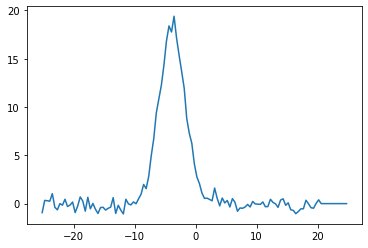

In [96]:
c = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Sep/specs_testOct28.npy', allow_pickle = True)[()][10]
eshift = 2.9
xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
xeV = xeV - eshift #2.5 #3 #know this from previous calibration
f = interp1d(xeV,c, bounds_error=False, fill_value = 0)
spec_in = f(eV[1340:-1340])
plt.plot(eV[1340:-1340], spec_in)
eshift = 2.7
xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
xeV = xeV - eshift #2.5 #3 #know this from previous calibration
f = interp1d(xeV,c, bounds_error=False, fill_value = 0)
spec_in = f(eV[1340:-1340])
#plt.plot(eV[1340:-1340], spec_in, ':')
fig,axs = plt.subplots()
plt.plot(eV[1340:-1340], spec_in)

In [6]:
! cp torchrecon_funcs.py /reg/d/psdm/tmo/tmox51020/results/paris/recon

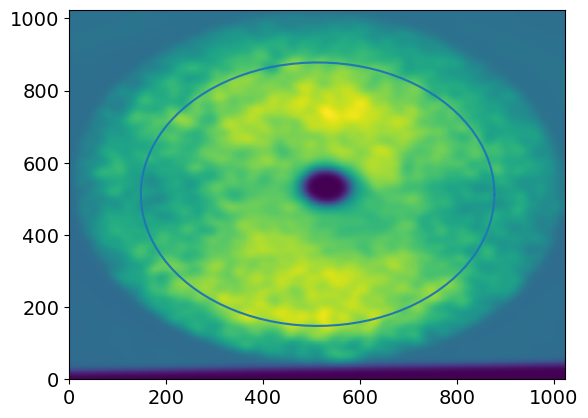

In [45]:
plt.pcolormesh(iiii)
phis = np.linspace(0,360,100)*np.pi/180
plt.plot(512+5.6*np.cos(347)+365*np.cos(phis), 512+5.6*np.cos(347)+365*np.sin(phis),)

In [42]:
R_vs_phi_1st, phi_1st = center_optimization_1st_polar(iiii, [512,512])
fit = lstSqFit(circpol, phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True) # phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True)

In [43]:
fit

(array([  5.60305325, 365.42739272, 347.05100458]), 19114.872376537853)

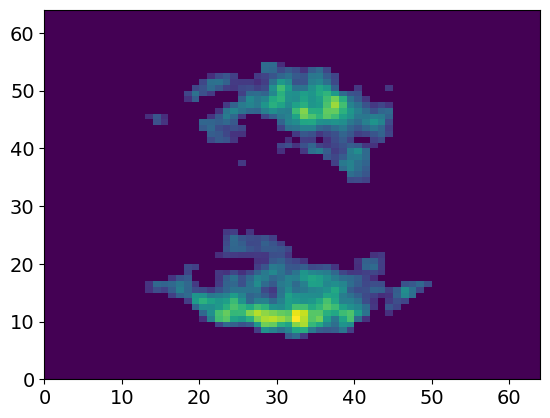

In [13]:
mdat = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Dec16.npy')
plt.pcolormesh(mdat[16])

In [24]:
R_vs_phi_1st, phi_1st = center_optimization_1st_polar(gf(cv2.resize(mdat[16], (1024,1024), interpolation = cv2.INTER_AREA),7), [512,512])
fit = lstSqFit(circpol, phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True) # phi_1st, R_vs_phi_1st, [5,300,100], return_resid=True)

In [25]:
fit

(array([ 17.53019695, 336.63918593, 228.24245851]), 35502.88634779221)

In [27]:
17.5/16

1.09375

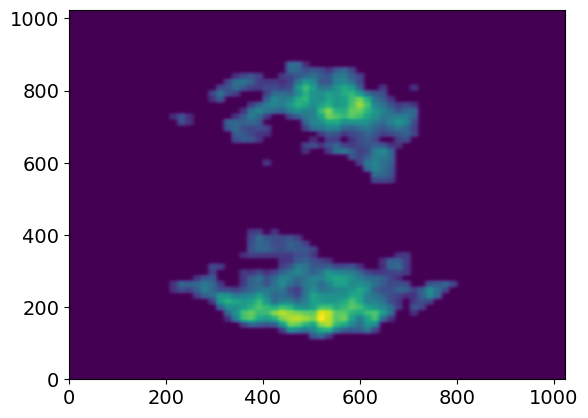

In [29]:
plt.pcolormesh(gf(cv2.resize(mdat[16], (1024,1024), interpolation = cv2.INTER_AREA),4))